<a href="https://colab.research.google.com/github/vietsharescom/Emotion-Detection_DeepLearning_Gr10/blob/main/EmotionDetectionYolo11n_Sina.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [12]:
import torch

print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA available: True
GPU: Tesla T4


In [13]:
from google.colab import drive

drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [14]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 74.8 MB/s eta 0:00:00


In [15]:
import ultralytics

ultralytics.checks()


Ultralytics 8.4.98 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 46.7/112.6 GB disk)


In [16]:
from pathlib import Path

DRIVE_ROOT = Path("/content/drive/MyDrive/EmotionYOLO")

ZIP_PATH = DRIVE_ROOT / "emotion.v3i.yolov11.zip"
LOCAL_ROOT = Path("/content/EmotionYOLO")
DATASET_DIR = LOCAL_ROOT / "emotion.v3i.yolov11"

RUNS_DIR = DRIVE_ROOT / "runs"

RUNS_DIR.mkdir(parents=True, exist_ok=True)

print("ZIP exists:", ZIP_PATH.exists())
print("ZIP path:", ZIP_PATH)


ZIP exists: True
ZIP path: /content/drive/MyDrive/EmotionYOLO/emotion.v3i.yolov11.zip


In [17]:
import shutil

if LOCAL_ROOT.exists():
    shutil.rmtree(LOCAL_ROOT)

LOCAL_ROOT.mkdir(parents=True, exist_ok=True)

shutil.unpack_archive(
    str(ZIP_PATH),
    str(LOCAL_ROOT)
)

print("Extract completed.")

Extract completed.


In [18]:
for path in LOCAL_ROOT.iterdir():
    print(path)

/content/EmotionYOLO/emotion.v3i.yolov11


In [19]:
yaml_files = list(LOCAL_ROOT.rglob("data.yaml"))

print("Found YAML files:", yaml_files)

if len(yaml_files) != 1:
    raise ValueError(
        f"Expected exactly one data.yaml, found {len(yaml_files)}"
    )

DATA_YAML = yaml_files[0]
DATASET_DIR = DATA_YAML.parent

print("Dataset directory:", DATASET_DIR)
print("Data YAML:", DATA_YAML)

Found YAML files: [PosixPath('/content/EmotionYOLO/emotion.v3i.yolov11/data.yaml')]
Dataset directory: /content/EmotionYOLO/emotion.v3i.yolov11
Data YAML: /content/EmotionYOLO/emotion.v3i.yolov11/data.yaml


In [20]:
TRAIN_IMAGES = DATASET_DIR / "train" / "images"
TRAIN_LABELS = DATASET_DIR / "train" / "labels"

VALID_IMAGES = DATASET_DIR / "valid" / "images"
VALID_LABELS = DATASET_DIR / "valid" / "labels"

TEST_IMAGES = DATASET_DIR / "test" / "images"
TEST_LABELS = DATASET_DIR / "test" / "labels"

image_extensions = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

def count_images(folder):
    return sum(
        1 for file in folder.iterdir()
        if file.suffix.lower() in image_extensions
    )

print("Train images:", count_images(TRAIN_IMAGES))
print("Train labels:", len(list(TRAIN_LABELS.glob("*.txt"))))

print("Valid images:", count_images(VALID_IMAGES))
print("Valid labels:", len(list(VALID_LABELS.glob("*.txt"))))

print("Test images:", count_images(TEST_IMAGES))
print("Test labels:", len(list(TEST_LABELS.glob("*.txt"))))


Train images: 3750
Train labels: 3750
Valid images: 431
Valid labels: 431
Test images: 239
Test labels: 239


In [21]:
from collections import Counter

class_names = [
    "Disgust",
    "Fear",
    "Happy",
    "Sad",
    "Surprise",
    "Angry",
    "Neutral"
]

def count_annotations(labels_dir):
    counts = Counter()

    for label_file in labels_dir.glob("*.txt"):
        with open(label_file, "r", encoding="utf-8") as file:
            for line in file:
                parts = line.strip().split()

                if not parts:
                    continue

                class_id = int(float(parts[0]))
                counts[class_id] += 1

    return counts

train_counts = count_annotations(TRAIN_LABELS)
valid_counts = count_annotations(VALID_LABELS)
test_counts = count_annotations(TEST_LABELS)

for class_id, class_name in enumerate(class_names):
    print(
        f"{class_id} {class_name:10s} | "
        f"train={train_counts[class_id]:4d} | "
        f"valid={valid_counts[class_id]:4d} | "
        f"test={test_counts[class_id]:4d}"
    )

0 Disgust    | train= 570 | valid=  63 | test=  56
1 Fear       | train= 597 | valid=  60 | test=  35
2 Happy      | train= 920 | valid= 104 | test=  61
3 Sad        | train= 555 | valid=  66 | test=  38
4 Surprise   | train= 853 | valid=  87 | test=  33
5 Angry      | train= 567 | valid=  61 | test=  37
6 Neutral    | train= 855 | valid= 111 | test=  44


In [22]:
import pandas as pd
import matplotlib.pyplot as plt

distribution_df = pd.DataFrame({
    "Class": class_names,
    "Train": [train_counts[i] for i in range(7)],
    "Validation": [valid_counts[i] for i in range(7)],
    "Test": [test_counts[i] for i in range(7)]
})

distribution_df

,Class,Train,Validation,Test
0,Disgust,570,63,56
1,Fear,597,60,35
2,Happy,920,104,61
3,Sad,555,66,38
4,Surprise,853,87,33
5,Angry,567,61,37
6,Neutral,855,111,44


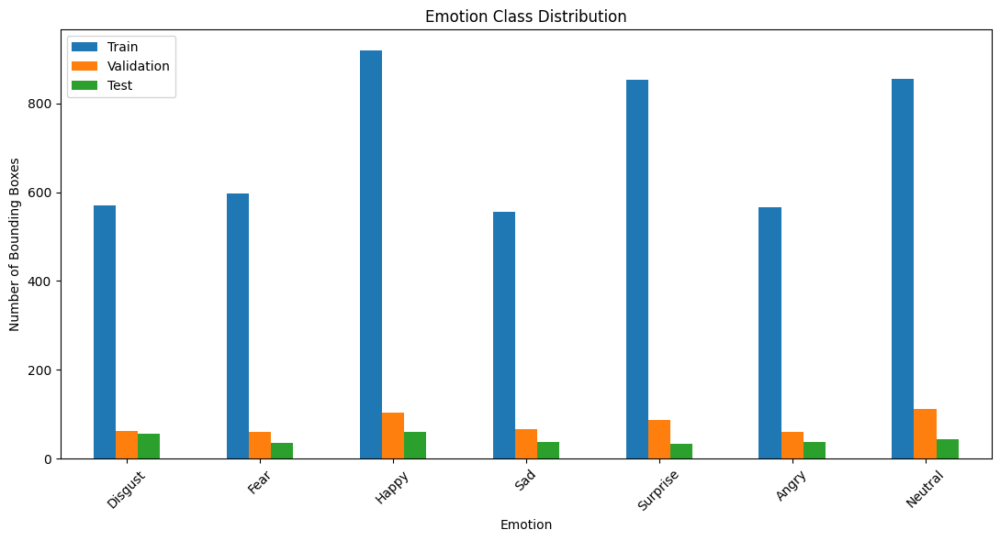

In [23]:
distribution_df.set_index("Class").plot(
    kind="bar",
    figsize=(11, 6)
)

plt.title("Emotion Class Distribution")
plt.xlabel("Emotion")
plt.ylabel("Number of Bounding Boxes")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

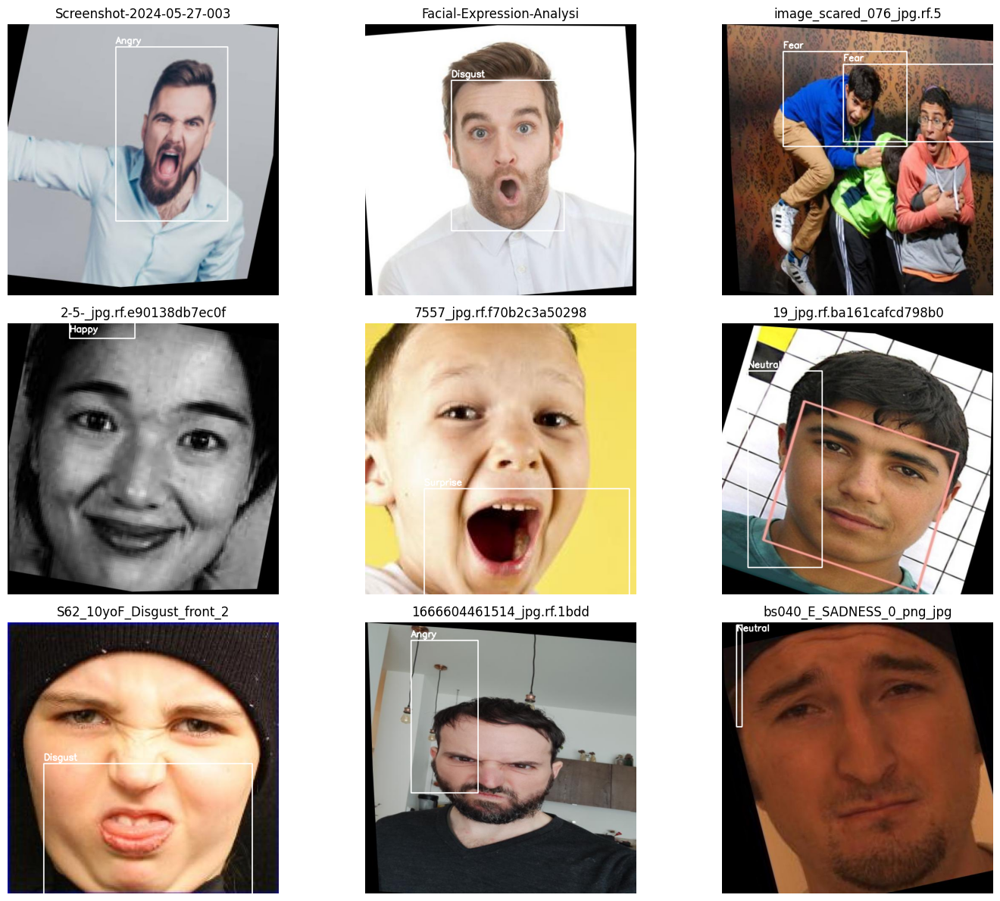

In [24]:
import random
import cv2
import matplotlib.pyplot as plt

def load_yolo_boxes(image_path, label_path):
    image = cv2.imread(str(image_path))

    if image is None:
        raise ValueError(f"Could not read image: {image_path}")

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    height, width = image.shape[:2]

    if label_path.exists():
        with open(label_path, "r", encoding="utf-8") as file:
            for line in file:
                parts = line.strip().split()

                if len(parts) < 5:
                    continue

                class_id = int(float(parts[0]))
                x_center, y_center, box_width, box_height = map(
                    float,
                    parts[1:5]
                )

                x1 = int((x_center - box_width / 2) * width)
                y1 = int((y_center - box_height / 2) * height)
                x2 = int((x_center + box_width / 2) * width)
                y2 = int((y_center + box_height / 2) * height)

                cv2.rectangle(
                    image,
                    (x1, y1),
                    (x2, y2),
                    (255, 255, 255),
                    2
                )

                cv2.putText(
                    image,
                    class_names[class_id],
                    (x1, max(y1 - 8, 20)),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.7,
                    (255, 255, 255),
                    2
                )

    return image

train_image_files = [
    file for file in TRAIN_IMAGES.iterdir()
    if file.suffix.lower() in image_extensions
]

selected_images = random.sample(
    train_image_files,
    min(9, len(train_image_files))
)

plt.figure(figsize=(15, 12))

for index, image_path in enumerate(selected_images):
    label_path = TRAIN_LABELS / f"{image_path.stem}.txt"

    annotated_image = load_yolo_boxes(
        image_path,
        label_path
    )

    plt.subplot(3, 3, index + 1)
    plt.imshow(annotated_image)
    plt.title(image_path.name[:25])
    plt.axis("off")

plt.tight_layout()
plt.show()

In [25]:
import random

label_files = list(TRAIN_LABELS.glob("*.txt"))

for file in random.sample(label_files, 10):

    print("="*60)
    print(file.name)

    with open(file) as f:
        for line in f:
            print(line.strip())

44-Photos-Of-Taylor-Swift-s-Surprised-Face_jpg.rf.7924d6e45b31efded4ca79dcbdb0cf4f.txt
4 0.508144142743451 0.5539510032310413 0.4538588214512673 0.8790783958952781
10005_jpg.rf.13222df123abd7cbb72255297ad92ddb.txt
0 0.5600930796875 0.61831270625 0.644394021875 0.5088372796875 0.6785700484375 0.36971229375000003 0.6352803421875 0.235148715625 0.3874643203125 0.21652421406250003 0.34820170156249997 0.46550329375 0.46895693281249995 0.6046282749999999 0.5600930796875 0.61831270625
3917_jpg.rf.7d76e0ea4bf307da589b7d1c28f0a435.txt
4 0.389805071875 0.997931634375 0.730802428125 0.9887680937500001 0.9642369109375 0.8238218609375 0.9390626734374999 0.044909021874999996 0.076694071875 0.1041666609375 0.0121904734375 0.471020125 0.0648275890625 0.8306946203125 0.389805071875 0.997931634375
H_0223_png_jpg.rf.6ef09ecaa0b405f6c6c3f8ca0f60abbd.txt
6 0.4401245875 0.90808830625 0.5817414421875 0.8955798843749999 0.7150280171875 0.7830040796875 0.76084531875 0.50781878125 0.79833215 0.3368703703125 0.2

In [26]:
import shutil
from pathlib import Path

BACKUP_LABELS_DIR = DATASET_DIR / "labels_backup"

if not BACKUP_LABELS_DIR.exists():
    BACKUP_LABELS_DIR.mkdir(parents=True)

    for split in ["train", "valid", "test"]:
        source = DATASET_DIR / split / "labels"
        destination = BACKUP_LABELS_DIR / split
        shutil.copytree(source, destination)

    print("Original labels backed up.")
else:
    print("Backup already exists.")

Original labels backed up.


In [27]:
def polygon_to_yolo_bbox(coordinates):
    """
    coordinates:
    [x1, y1, x2, y2, ..., xn, yn]
    All values are normalized between 0 and 1.
    """
    x_values = coordinates[0::2]
    y_values = coordinates[1::2]

    x_min = max(0.0, min(x_values))
    x_max = min(1.0, max(x_values))
    y_min = max(0.0, min(y_values))
    y_max = min(1.0, max(y_values))

    width = x_max - x_min
    height = y_max - y_min
    x_center = (x_min + x_max) / 2
    y_center = (y_min + y_max) / 2

    return x_center, y_center, width, height


def convert_label_file(label_file):
    converted_lines = []
    skipped_lines = 0

    with open(label_file, "r", encoding="utf-8") as file:
        for line in file:
            parts = line.strip().split()

            if not parts:
                continue

            class_id = int(float(parts[0]))
            values = list(map(float, parts[1:]))

            # Standard YOLO bounding box
            if len(values) == 4:
                x_center, y_center, width, height = values

            # Segmentation polygon
            elif len(values) >= 6 and len(values) % 2 == 0:
                x_center, y_center, width, height = polygon_to_yolo_bbox(
                    values
                )

            else:
                skipped_lines += 1
                continue

            # Reject invalid or zero-size boxes
            if width <= 0 or height <= 0:
                skipped_lines += 1
                continue

            converted_lines.append(
                f"{class_id} "
                f"{x_center:.6f} "
                f"{y_center:.6f} "
                f"{width:.6f} "
                f"{height:.6f}"
            )

    with open(label_file, "w", encoding="utf-8") as file:
        if converted_lines:
            file.write("\n".join(converted_lines) + "\n")

    return len(converted_lines), skipped_lines

In [28]:
def polygon_to_yolo_bbox(coordinates):
    """
    coordinates:
    [x1, y1, x2, y2, ..., xn, yn]
    All values are normalized between 0 and 1.
    """
    x_values = coordinates[0::2]
    y_values = coordinates[1::2]

    x_min = max(0.0, min(x_values))
    x_max = min(1.0, max(x_values))
    y_min = max(0.0, min(y_values))
    y_max = min(1.0, max(y_values))

    width = x_max - x_min
    height = y_max - y_min
    x_center = (x_min + x_max) / 2
    y_center = (y_min + y_max) / 2

    return x_center, y_center, width, height


def convert_label_file(label_file):
    converted_lines = []
    skipped_lines = 0

    with open(label_file, "r", encoding="utf-8") as file:
        for line in file:
            parts = line.strip().split()

            if not parts:
                continue

            class_id = int(float(parts[0]))
            values = list(map(float, parts[1:]))

            # Standard YOLO bounding box
            if len(values) == 4:
                x_center, y_center, width, height = values

            # Segmentation polygon
            elif len(values) >= 6 and len(values) % 2 == 0:
                x_center, y_center, width, height = polygon_to_yolo_bbox(
                    values
                )

            else:
                skipped_lines += 1
                continue

            # Reject invalid or zero-size boxes
            if width <= 0 or height <= 0:
                skipped_lines += 1
                continue

            converted_lines.append(
                f"{class_id} "
                f"{x_center:.6f} "
                f"{y_center:.6f} "
                f"{width:.6f} "
                f"{height:.6f}"
            )

    with open(label_file, "w", encoding="utf-8") as file:
        if converted_lines:
            file.write("\n".join(converted_lines) + "\n")

    return len(converted_lines), skipped_lines

In [29]:
conversion_summary = {}

for split in ["train", "valid", "test"]:
    labels_dir = DATASET_DIR / split / "labels"

    total_boxes = 0
    total_skipped = 0
    total_files = 0

    for label_file in labels_dir.glob("*.txt"):
        converted, skipped = convert_label_file(label_file)

        total_boxes += converted
        total_skipped += skipped
        total_files += 1

    conversion_summary[split] = {
        "files": total_files,
        "boxes": total_boxes,
        "skipped": total_skipped
    }

conversion_summary

{'train': {'files': 3750, 'boxes': 4917, 'skipped': 0},
 'valid': {'files': 431, 'boxes': 552, 'skipped': 0},
 'test': {'files': 239, 'boxes': 304, 'skipped': 0}}

In [30]:
invalid_labels = []

for split in ["train", "valid", "test"]:
    labels_dir = DATASET_DIR / split / "labels"

    for label_file in labels_dir.glob("*.txt"):
        with open(label_file, "r", encoding="utf-8") as file:
            for line_number, line in enumerate(file, start=1):
                parts = line.strip().split()

                if parts and len(parts) != 5:
                    invalid_labels.append(
                        (split, label_file.name, line_number, len(parts))
                    )

print("Invalid label lines:", len(invalid_labels))

if invalid_labels:
    print(invalid_labels[:10])
else:
    print("All labels now use standard YOLO detection format.")

Invalid label lines: 0
All labels now use standard YOLO detection format.


In [31]:
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt

boxes_per_image = []
box_widths = []
box_heights = []
box_areas = []

for split in ["train", "valid", "test"]:
    labels_dir = DATASET_DIR / split / "labels"

    for label_file in labels_dir.glob("*.txt"):
        with open(label_file, "r", encoding="utf-8") as file:
            lines = [line.strip() for line in file if line.strip()]

        boxes_per_image.append(len(lines))

        for line in lines:
            class_id, xc, yc, width, height = map(
                float,
                line.split()
            )

            box_widths.append(width)
            box_heights.append(height)
            box_areas.append(width * height)

print("Images with label files:", len(boxes_per_image))
print("Total bounding boxes:", len(box_areas))
print("Average boxes per image:", np.mean(boxes_per_image))
print("Maximum boxes in one image:", np.max(boxes_per_image))
print("Average normalized box area:", np.mean(box_areas))
print("Small boxes under 1% area:", np.mean(np.array(box_areas) < 0.01))

Images with label files: 4420
Total bounding boxes: 5773
Average boxes per image: 1.306108597285068
Maximum boxes in one image: 38
Average normalized box area: 0.37475950883350273
Small boxes under 1% area: 0.07309890871297418


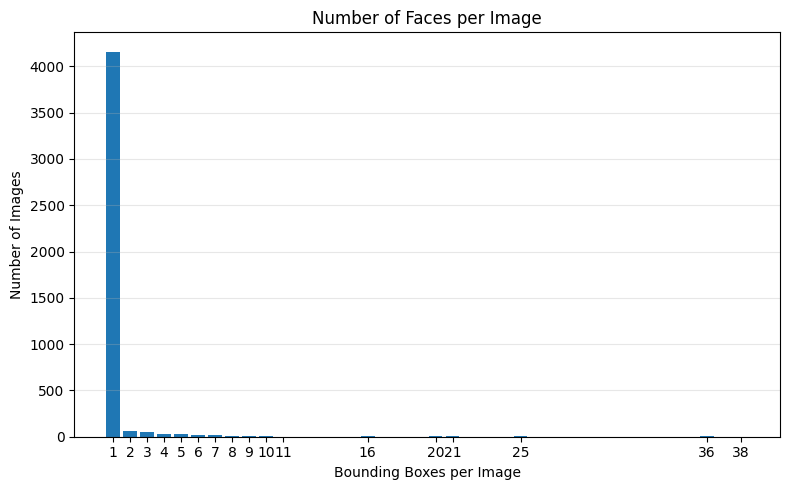

In [32]:
face_counts = Counter(boxes_per_image)

plt.figure(figsize=(8, 5))
plt.bar(
    list(face_counts.keys()),
    list(face_counts.values())
)
plt.title("Number of Faces per Image")
plt.xlabel("Bounding Boxes per Image")
plt.ylabel("Number of Images")
plt.xticks(sorted(face_counts.keys()))
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

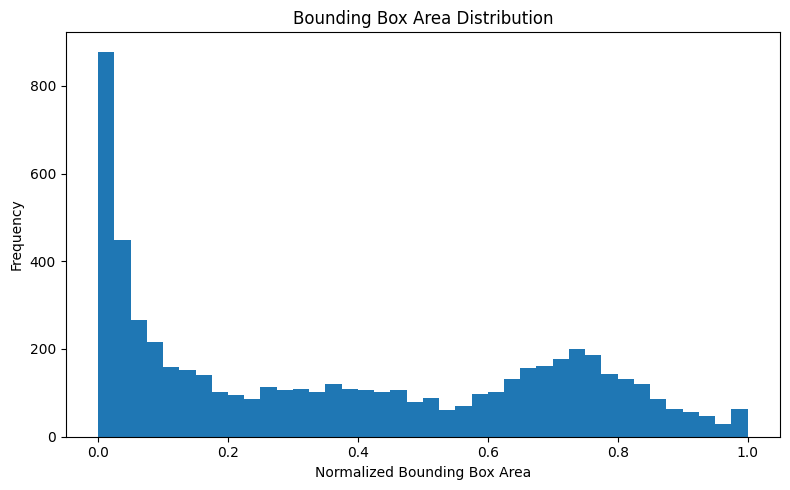

In [33]:
plt.figure(figsize=(8, 5))
plt.hist(box_areas, bins=40)
plt.title("Bounding Box Area Distribution")
plt.xlabel("Normalized Bounding Box Area")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

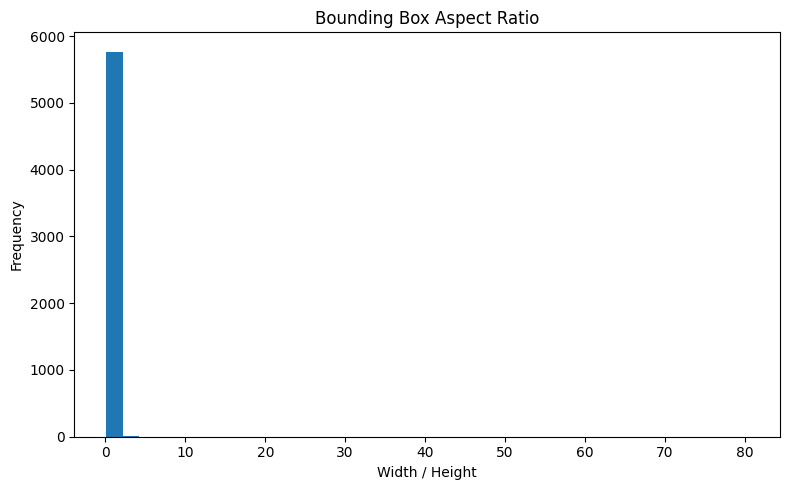

In [34]:
aspect_ratios = np.array(box_widths) / np.array(box_heights)

plt.figure(figsize=(8, 5))
plt.hist(aspect_ratios, bins=40)
plt.title("Bounding Box Aspect Ratio")
plt.xlabel("Width / Height")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

Minimum aspect ratio: 0.1291302141791848
Median aspect ratio: 0.7951931439927532
95th percentile: 1.1102218354614632
99th percentile: 1.3607757396325724
Maximum aspect ratio: 80.40246045694201


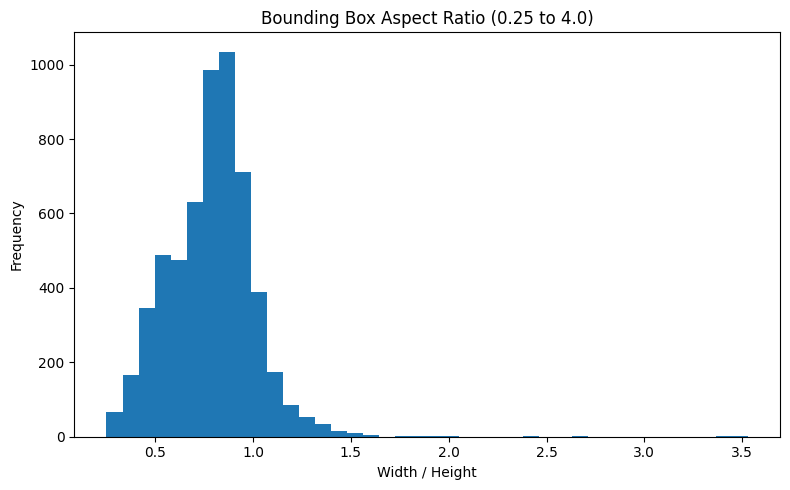

In [35]:
import numpy as np
import matplotlib.pyplot as plt

aspect_ratios = np.array(box_widths) / np.array(box_heights)

print("Minimum aspect ratio:", aspect_ratios.min())
print("Median aspect ratio:", np.median(aspect_ratios))
print("95th percentile:", np.percentile(aspect_ratios, 95))
print("99th percentile:", np.percentile(aspect_ratios, 99))
print("Maximum aspect ratio:", aspect_ratios.max())

normal_ratios = aspect_ratios[
    (aspect_ratios >= 0.25) &
    (aspect_ratios <= 4.0)
]

plt.figure(figsize=(8, 5))
plt.hist(normal_ratios, bins=40)

plt.title("Bounding Box Aspect Ratio (0.25 to 4.0)")
plt.xlabel("Width / Height")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

In [36]:
suspicious_boxes = []

for split in ["train", "valid", "test"]:
    labels_dir = DATASET_DIR / split / "labels"
    images_dir = DATASET_DIR / split / "images"

    for label_file in labels_dir.glob("*.txt"):
        with open(label_file, "r", encoding="utf-8") as file:
            for line_number, line in enumerate(file, start=1):
                parts = line.strip().split()

                if len(parts) != 5:
                    continue

                class_id, xc, yc, width, height = map(float, parts)

                area = width * height
                ratio = width / height if height > 0 else float("inf")

                if (
                    width < 0.02 or
                    height < 0.02 or
                    area < 0.0025 or
                    ratio < 0.20 or
                    ratio > 5.0
                ):
                    matching_images = list(
                        images_dir.glob(f"{label_file.stem}.*")
                    )

                    suspicious_boxes.append({
                        "split": split,
                        "label_file": label_file,
                        "image_file": (
                            matching_images[0]
                            if matching_images
                            else None
                        ),
                        "line_number": line_number,
                        "class_id": int(class_id),
                        "width": width,
                        "height": height,
                        "area": area,
                        "ratio": ratio
                    })

print("Suspicious boxes:", len(suspicious_boxes))

for item in suspicious_boxes[:20]:
    print(
        item["split"],
        item["label_file"].name,
        "class:",
        class_names[item["class_id"]],
        "w:",
        round(item["width"], 4),
        "h:",
        round(item["height"], 4),
        "area:",
        round(item["area"], 5),
        "ratio:",
        round(item["ratio"], 2)
    )

Suspicious boxes: 62
train image_surprised_266_jpg.rf.e67e5d03583b03956d53347875b4b90f.txt class: Surprise w: 0.0336 h: 0.0617 area: 0.00207 ratio: 0.54
train image_surprised_266_jpg.rf.e67e5d03583b03956d53347875b4b90f.txt class: Surprise w: 0.032 h: 0.0469 area: 0.0015 ratio: 0.68
train image_happy_19_jpg.rf.973311154f5a57c9f06d86b76f8996dd.txt class: Happy w: 0.0305 h: 0.0734 area: 0.00224 ratio: 0.41
train image_happy_19_jpg.rf.973311154f5a57c9f06d86b76f8996dd.txt class: Happy w: 0.0297 h: 0.0633 area: 0.00188 ratio: 0.47
train image_happy_19_jpg.rf.973311154f5a57c9f06d86b76f8996dd.txt class: Happy w: 0.032 h: 0.0688 area: 0.0022 ratio: 0.47
train image_happy_19_jpg.rf.973311154f5a57c9f06d86b76f8996dd.txt class: Happy w: 0.0336 h: 0.0711 area: 0.00239 ratio: 0.47
train image_happy_19_jpg.rf.973311154f5a57c9f06d86b76f8996dd.txt class: Happy w: 0.0273 h: 0.0719 area: 0.00197 ratio: 0.38
train image_surprised_266_jpg.rf.282ca341f0512b18686965c70981880e.txt class: Surprise w: 0.0457 h: 

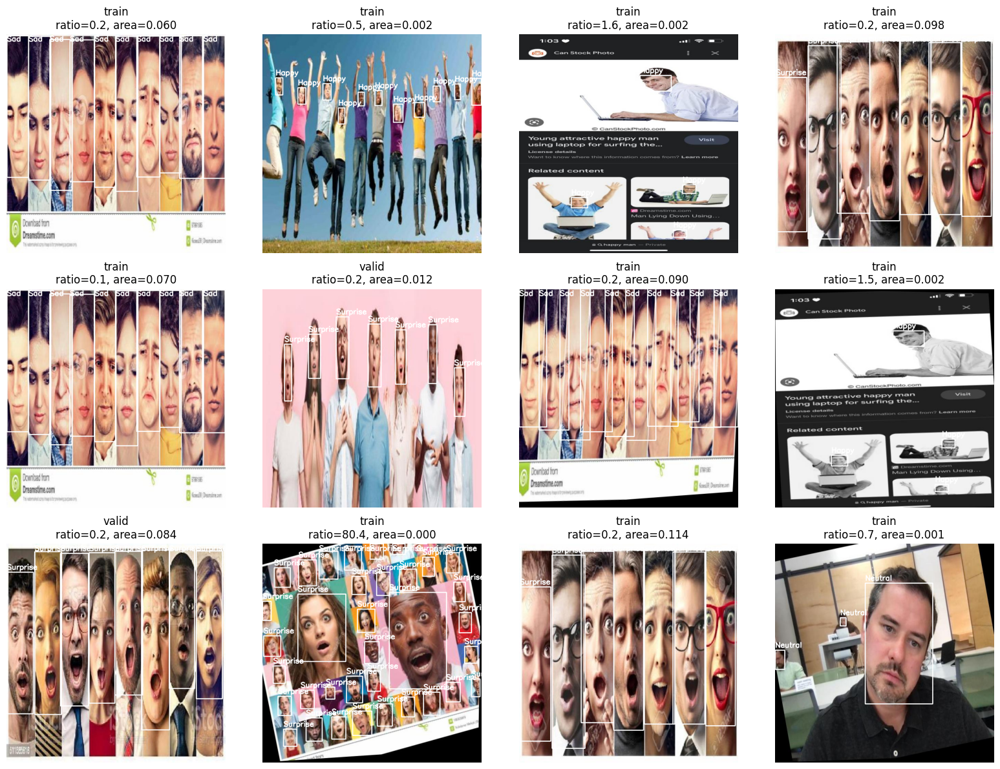

In [37]:
import random
import cv2
import matplotlib.pyplot as plt

selected_suspicious = random.sample(
    suspicious_boxes,
    min(12, len(suspicious_boxes))
)

plt.figure(figsize=(16, 12))

for index, item in enumerate(selected_suspicious):
    image_path = item["image_file"]
    label_path = item["label_file"]

    if image_path is None:
        continue

    image = load_yolo_boxes(
        image_path,
        label_path
    )

    plt.subplot(3, 4, index + 1)
    plt.imshow(image)

    plt.title(
        f'{item["split"]}\n'
        f'ratio={item["ratio"]:.1f}, '
        f'area={item["area"]:.3f}'
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [38]:
many_face_files = []

for split in ["train", "valid", "test"]:
    labels_dir = DATASET_DIR / split / "labels"
    images_dir = DATASET_DIR / split / "images"

    for label_file in labels_dir.glob("*.txt"):
        with open(label_file, "r", encoding="utf-8") as file:
            lines = [
                line.strip()
                for line in file
                if line.strip()
            ]

        if len(lines) >= 10:
            image_matches = list(
                images_dir.glob(f"{label_file.stem}.*")
            )

            many_face_files.append({
                "split": split,
                "label": label_file,
                "image": (
                    image_matches[0]
                    if image_matches
                    else None
                ),
                "count": len(lines)
            })

many_face_files = sorted(
    many_face_files,
    key=lambda item: item["count"],
    reverse=True
)

for item in many_face_files[:10]:
    print(
        item["split"],
        item["count"],
        item["image"]
    )

train 38 /content/EmotionYOLO/emotion.v3i.yolov11/train/images/image_surprised_266_jpg.rf.e67e5d03583b03956d53347875b4b90f.jpg
train 38 /content/EmotionYOLO/emotion.v3i.yolov11/train/images/image_surprised_266_jpg.rf.a87e98b90af902f5fc517bc14ea38dd0.jpg
train 36 /content/EmotionYOLO/emotion.v3i.yolov11/train/images/image_surprised_266_jpg.rf.282ca341f0512b18686965c70981880e.jpg
train 36 /content/EmotionYOLO/emotion.v3i.yolov11/train/images/image_angry_267_jpg.rf.86054bc52915ff2b1fe4b62def6ea683.jpg
train 36 /content/EmotionYOLO/emotion.v3i.yolov11/train/images/image_angry_267_jpg.rf.3f890c1b0140988180db1835ab9b016b.jpg
train 36 /content/EmotionYOLO/emotion.v3i.yolov11/train/images/image_angry_267_jpg.rf.3cfac6a849b784336f1409c80fcd60d0.jpg
train 25 /content/EmotionYOLO/emotion.v3i.yolov11/train/images/image_sad_048_jpg.rf.a2250d8316a886c7e2f8d8fb569ed773.jpg
train 25 /content/EmotionYOLO/emotion.v3i.yolov11/train/images/image_sad_048_jpg.rf.1b110d2a1ad07de67ad544f7403668de.jpg
train 25

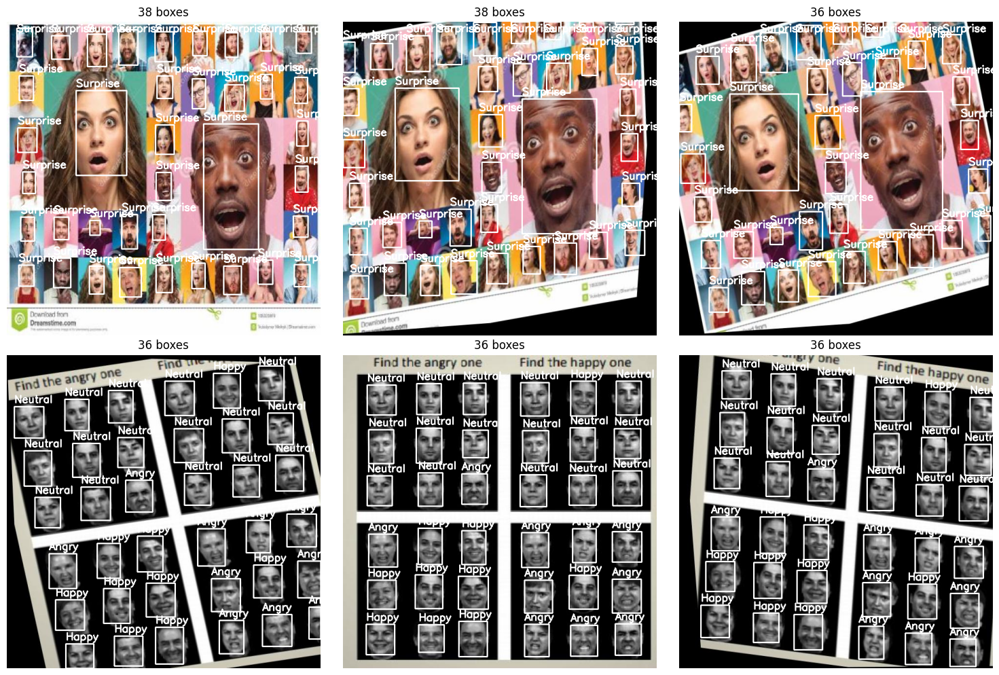

In [39]:
plt.figure(figsize=(15, 10))

for index, item in enumerate(many_face_files[:6]):
    if item["image"] is None:
        continue

    image = load_yolo_boxes(
        item["image"],
        item["label"]
    )

    plt.subplot(2, 3, index + 1)
    plt.imshow(image)
    plt.title(f'{item["count"]} boxes')
    plt.axis("off")

plt.tight_layout()
plt.show()

In [40]:
import shutil
from pathlib import Path

CLEAN_DATASET_DIR = Path("/content/EmotionYOLO_Clean")

if CLEAN_DATASET_DIR.exists():
    shutil.rmtree(CLEAN_DATASET_DIR)

shutil.copytree(DATASET_DIR, CLEAN_DATASET_DIR)

print("Clean dataset copy created:")
print(CLEAN_DATASET_DIR)

Clean dataset copy created:
/content/EmotionYOLO_Clean


In [41]:
IMAGE_EXTENSIONS = [".jpg", ".jpeg", ".png", ".bmp", ".webp"]

cleaning_summary = {
    "removed_collage_images": 0,
    "removed_bad_boxes": 0,
    "removed_empty_images": 0,
    "kept_boxes": 0
}


def find_matching_image(images_dir, stem):
    for extension in IMAGE_EXTENSIONS:
        candidate = images_dir / f"{stem}{extension}"

        if candidate.exists():
            return candidate

    # Handles unusual uppercase extensions
    matches = list(images_dir.glob(f"{stem}.*"))
    return matches[0] if matches else None


for split in ["train", "valid", "test"]:
    labels_dir = CLEAN_DATASET_DIR / split / "labels"
    images_dir = CLEAN_DATASET_DIR / split / "images"

    for label_file in list(labels_dir.glob("*.txt")):
        with open(label_file, "r", encoding="utf-8") as file:
            original_lines = [
                line.strip()
                for line in file
                if line.strip()
            ]

        image_path = find_matching_image(
            images_dir,
            label_file.stem
        )

        # Remove posters/collages containing many small faces
        if len(original_lines) >= 10:
            label_file.unlink(missing_ok=True)

            if image_path is not None:
                image_path.unlink(missing_ok=True)

            cleaning_summary["removed_collage_images"] += 1
            continue

        valid_lines = []

        for line in original_lines:
            parts = line.split()

            if len(parts) != 5:
                cleaning_summary["removed_bad_boxes"] += 1
                continue

            class_id, xc, yc, width, height = map(float, parts)

            area = width * height
            aspect_ratio = (
                width / height
                if height > 0
                else float("inf")
            )

            # Conservative quality filters
            is_valid = (
                0 <= class_id <= 6
                and 0 <= xc <= 1
                and 0 <= yc <= 1
                and 0 < width <= 1
                and 0 < height <= 1
                and area >= 0.0025
                and 0.20 <= aspect_ratio <= 5.0
            )

            if is_valid:
                valid_lines.append(line)
                cleaning_summary["kept_boxes"] += 1
            else:
                cleaning_summary["removed_bad_boxes"] += 1

        if valid_lines:
            with open(label_file, "w", encoding="utf-8") as file:
                file.write("\n".join(valid_lines) + "\n")
        else:
            label_file.unlink(missing_ok=True)

            if image_path is not None:
                image_path.unlink(missing_ok=True)

            cleaning_summary["removed_empty_images"] += 1


print("Cleaning completed:\n")

for key, value in cleaning_summary.items():
    print(f"{key}: {value}")

Cleaning completed:

removed_collage_images: 38
removed_bad_boxes: 35
removed_empty_images: 2
kept_boxes: 5031


In [42]:
import yaml

CLEAN_YAML = CLEAN_DATASET_DIR / "data.yaml"

clean_config = {
    "train": str(CLEAN_DATASET_DIR / "train" / "images"),
    "val": str(CLEAN_DATASET_DIR / "valid" / "images"),
    "test": str(CLEAN_DATASET_DIR / "test" / "images"),
    "nc": 7,
    "names": [
        "Disgust",
        "Fear",
        "Happy",
        "Sad",
        "Surprise",
        "Angry",
        "Neutral"
    ]
}

with open(CLEAN_YAML, "w", encoding="utf-8") as file:
    yaml.safe_dump(
        clean_config,
        file,
        sort_keys=False
    )

print("Clean YAML:")
print(CLEAN_YAML)

Clean YAML:
/content/EmotionYOLO_Clean/data.yaml


In [43]:
def count_files(folder, extensions=None):
    if extensions is None:
        return len(list(folder.glob("*")))

    return sum(
        1
        for file in folder.iterdir()
        if file.suffix.lower() in extensions
    )


for split in ["train", "valid", "test"]:
    images_dir = CLEAN_DATASET_DIR / split / "images"
    labels_dir = CLEAN_DATASET_DIR / split / "labels"

    image_count = count_files(
        images_dir,
        set(IMAGE_EXTENSIONS)
    )

    label_count = len(
        list(labels_dir.glob("*.txt"))
    )

    print(
        f"{split:5s}: "
        f"images={image_count}, "
        f"labels={label_count}"
    )

train: images=3716, labels=3716
valid: images=426, labels=426
test : images=238, labels=238


In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")

results = model.train(
    data=str(CLEAN_YAML),
    epochs=100,
    imgsz=640,
    batch=16,
    optimizer="AdamW",
    lr0=0.001,
    cos_lr=True,
    patience=20,
    cache=True,
    workers=2,
    project=str(RUNS_DIR),
    name="emotion_yolo11n_baseline",
    exist_ok=True,
    seed=42
)

New https://pypi.org/project/ultralytics/8.4.97 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.96 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/EmotionYOLO_Clean/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, 

In [44]:
from ultralytics import YOLO
from pathlib import Path

LAST_MODEL = Path(
    "/content/drive/MyDrive/EmotionYOLO/"
    "runs/emotion_yolo11n_baseline/weights/last.pt"
)

resume_model = YOLO(str(LAST_MODEL))
resume_results = resume_model.train(resume=True)

Ultralytics 8.4.98 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/EmotionYOLO_Clean/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=emotion_y

In [45]:
import shutil
from pathlib import Path

OUTPUT_ZIP = DRIVE_ROOT / "EmotionYOLO_Clean"

shutil.make_archive(
    base_name=str(OUTPUT_ZIP),
    format="zip",
    root_dir=str(CLEAN_DATASET_DIR)
)

print("Saved:")
print(str(OUTPUT_ZIP) + ".zip")

Saved:
/content/drive/MyDrive/EmotionYOLO/EmotionYOLO_Clean.zip


In [46]:
!nvidia-smi

Fri Jul 17 04:05:47 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   59C    P0             28W /   70W |     403MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [47]:
from pathlib import Path

runs = list(RUNS_DIR.glob("**/*"))

print(len(runs))

for r in runs[-20:]:
    print(r)


23
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/labels.jpg
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/train_batch0.jpg
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/train_batch1.jpg
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/train_batch2.jpg
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/results.csv
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/val_batch0_pred.jpg
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/val_batch0_labels.jpg
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/val_batch1_pred.jpg
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/val_batch1_labels.jpg
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/val_batch2_labels.jpg
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/val_batch2_pred.jpg
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/BoxPR_curve.png
/

In [48]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [49]:
from pathlib import Path

DRIVE_ROOT = Path("/content/drive/MyDrive/EmotionYOLO")

print(DRIVE_ROOT.exists())

True


In [50]:
import os

for root, dirs, files in os.walk("/content/drive/MyDrive/EmotionYOLO"):
    print(root)
    print("Folders:", dirs)
    print("Files:", files)
    print("-"*60)

/content/drive/MyDrive/EmotionYOLO
Folders: ['runs']
Files: ['emotion.v3i.yolov11.zip', 'EmotionYOLO_Clean.zip']
------------------------------------------------------------
/content/drive/MyDrive/EmotionYOLO/runs
Folders: ['emotion_yolo11n_baseline']
Files: []
------------------------------------------------------------
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline
Folders: ['weights']
Files: ['args.yaml', 'labels.jpg', 'train_batch0.jpg', 'train_batch1.jpg', 'train_batch2.jpg', 'results.csv', 'val_batch0_pred.jpg', 'val_batch0_labels.jpg', 'val_batch1_pred.jpg', 'val_batch1_labels.jpg', 'val_batch2_labels.jpg', 'val_batch2_pred.jpg', 'BoxPR_curve.png', 'BoxF1_curve.png', 'BoxP_curve.png', 'BoxR_curve.png', 'confusion_matrix_normalized.png', 'confusion_matrix.png', 'results.png']
------------------------------------------------------------
/content/drive/MyDrive/EmotionYOLO/runs/emotion_yolo11n_baseline/weights
Folders: []
Files: ['best.pt', 'last.pt']
-------------

In [51]:
from pathlib import Path

DRIVE_ROOT = Path("/content/drive/MyDrive/EmotionYOLO")
RUN_DIR = DRIVE_ROOT / "runs" / "emotion_yolo11n_baseline"

LAST_MODEL = RUN_DIR / "weights" / "last.pt"
BEST_MODEL = RUN_DIR / "weights" / "best.pt"

print("Last model exists:", LAST_MODEL.exists())
print("Best model exists:", BEST_MODEL.exists())

Last model exists: True
Best model exists: True


In [52]:
import yaml

with open(RUN_DIR / "args.yaml", "r", encoding="utf-8") as file:
    previous_args = yaml.safe_load(file)

print("Previous data path:", previous_args.get("data"))
print("Previous epochs:", previous_args.get("epochs"))

Previous data path: /content/EmotionYOLO_Clean/data.yaml
Previous epochs: 100


In [53]:
from pathlib import Path

CLEAN_DATASET_DIR = Path("/content/EmotionYOLO_Clean")
CLEAN_YAML = CLEAN_DATASET_DIR / "data.yaml"

print("Clean dataset exists:", CLEAN_DATASET_DIR.exists())
print("Clean YAML exists:", CLEAN_YAML.exists())

Clean dataset exists: True
Clean YAML exists: True


In [54]:
from ultralytics import YOLO
from pathlib import Path

BEST_MODEL = Path(
    "/content/drive/MyDrive/EmotionYOLO/"
    "runs/emotion_yolo11n_baseline/weights/best.pt"
)

CLEAN_YAML = Path("/content/EmotionYOLO_Clean/data.yaml")

model = YOLO(str(BEST_MODEL))

test_results = model.val(
    data=str(CLEAN_YAML),
    split="test",
    imgsz=640,
    batch=16,
    plots=True,
    project="/content/drive/MyDrive/EmotionYOLO/runs",
    name="emotion_yolo11n_test",
    exist_ok=True
)

Ultralytics 8.4.98 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 101 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 724.8±153.7 MB/s, size: 39.0 KB)
val: Scanning /content/EmotionYOLO_Clean/test/labels... 238 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 238/238 1.6Kit/s 0.1s
val: New cache created: /content/EmotionYOLO_Clean/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 15/15 3.8it/s 4.0s
                   all        238        294      0.606      0.612      0.639      0.419
               Disgust         28         46      0.582      0.587      0.695      0.492
                  Fear         34         35      0.508      0.457      0.498      0.333
                 Happy         50         61       0.79      0.865      0.887      0.516
                   Sad         35         38      0.655        0.

In [55]:
print("Test Precision:", test_results.box.mp)
print("Test Recall:", test_results.box.mr)
print("Test mAP50:", test_results.box.map50)
print("Test mAP50-95:", test_results.box.map)

Test Precision: 0.6055701057849315
Test Recall: 0.6121338220234627
Test mAP50: 0.6392470971357431
Test mAP50-95: 0.41880184989039737


In [56]:
from pathlib import Path

DRIVE_ROOT = Path("/content/drive/MyDrive/EmotionYOLO")
TEST_RUN_DIR = DRIVE_ROOT / "runs" / "emotion_yolo11n_test"

print("Test run exists:", TEST_RUN_DIR.exists())

for file in TEST_RUN_DIR.glob("*"):
    print(file.name)

Test run exists: True
val_batch0_labels.jpg
val_batch0_pred.jpg
val_batch1_labels.jpg
val_batch1_pred.jpg
val_batch2_labels.jpg
val_batch2_pred.jpg
BoxPR_curve.png
BoxF1_curve.png
BoxP_curve.png
BoxR_curve.png
confusion_matrix_normalized.png
confusion_matrix.png


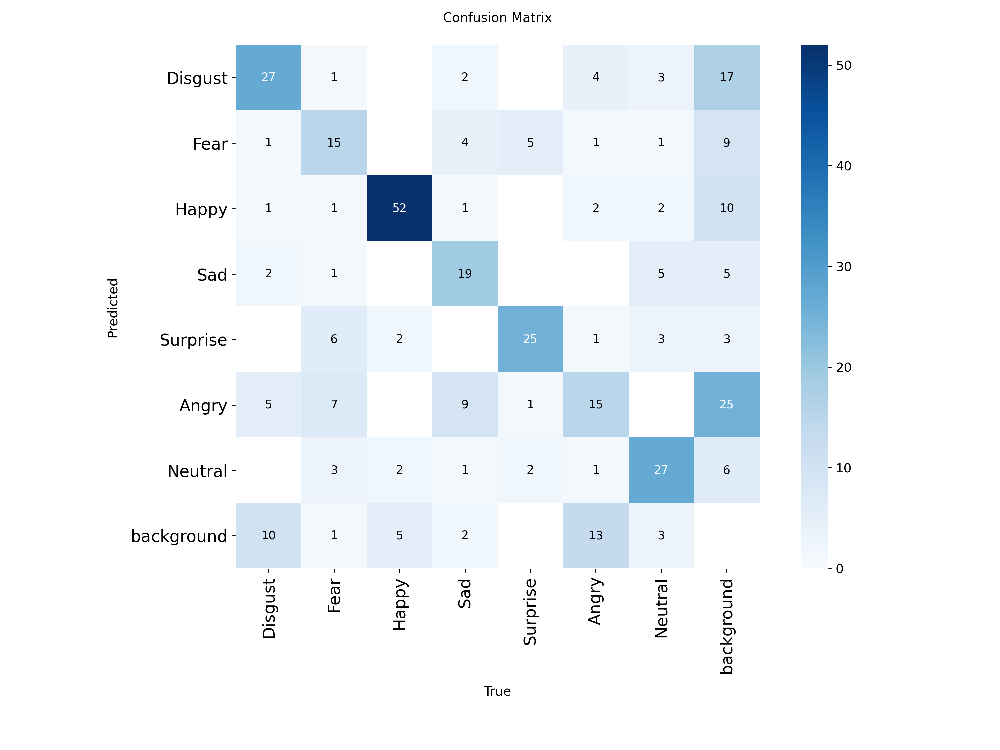

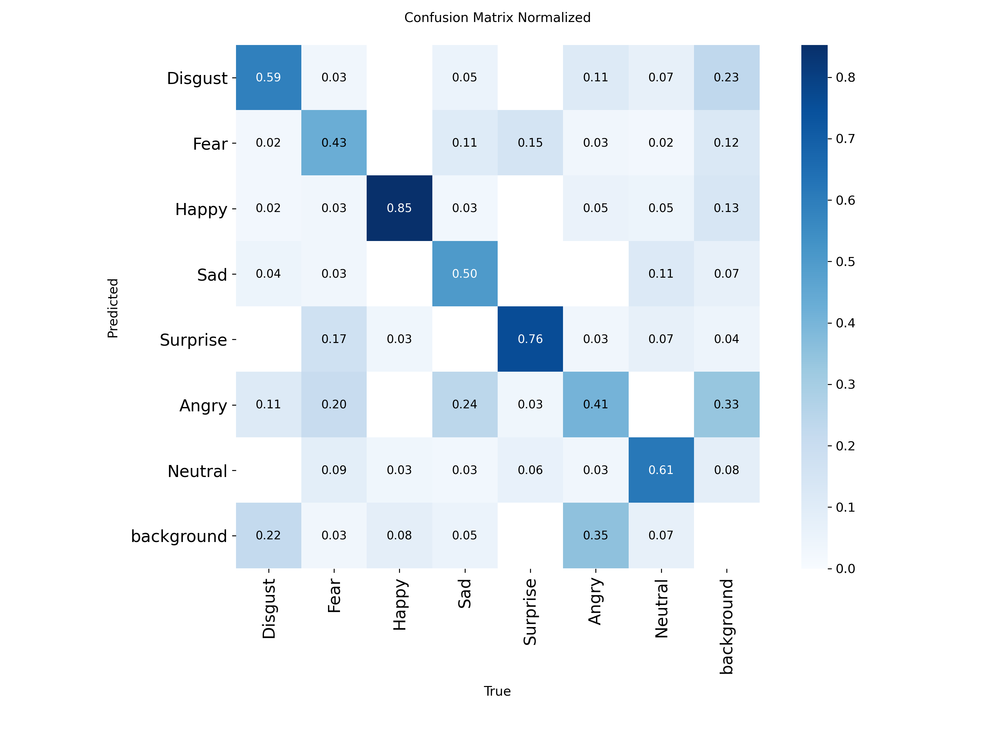

In [57]:
from IPython.display import display, Image

cm_path = TEST_RUN_DIR / "confusion_matrix.png"
cm_norm_path = TEST_RUN_DIR / "confusion_matrix_normalized.png"

if cm_path.exists():
    display(Image(filename=str(cm_path), width=850))
else:
    print("confusion_matrix.png not found")

if cm_norm_path.exists():
    display(Image(filename=str(cm_norm_path), width=850))
else:
    print("confusion_matrix_normalized.png not found")

In [58]:
from ultralytics import YOLO
from pathlib import Path
import shutil
import cv2
import numpy as np
import pandas as pd

BEST_MODEL = Path(
    "/content/drive/MyDrive/EmotionYOLO/"
    "runs/emotion_yolo11n_baseline/weights/best.pt"
)

TEST_IMAGES_DIR = Path("/content/EmotionYOLO_Clean/test/images")
TEST_LABELS_DIR = Path("/content/EmotionYOLO_Clean/test/labels")

ERROR_DIR = DRIVE_ROOT / "error_analysis"
ERROR_DIR.mkdir(parents=True, exist_ok=True)

for folder_name in [
    "all_predictions",
    "no_predictions",
    "angry_cases",
    "fear_cases",
    "sad_cases"
]:
    (ERROR_DIR / folder_name).mkdir(parents=True, exist_ok=True)

model = YOLO(str(BEST_MODEL))

class_names = {
    0: "Disgust",
    1: "Fear",
    2: "Happy",
    3: "Sad",
    4: "Surprise",
    5: "Angry",
    6: "Neutral"
}

target_classes = {
    1: "fear_cases",
    3: "sad_cases",
    5: "angry_cases"
}

records = []

image_paths = sorted([
    p for p in TEST_IMAGES_DIR.iterdir()
    if p.suffix.lower() in [".jpg", ".jpeg", ".png", ".bmp", ".webp"]
])

results = model.predict(
    source=[str(p) for p in image_paths],
    conf=0.25,
    iou=0.45,
    imgsz=640,
    save=False,
    verbose=False,
    stream=True
)

for image_path, result in zip(image_paths, results):

    label_path = TEST_LABELS_DIR / f"{image_path.stem}.txt"

    true_classes = []
    if label_path.exists():
        for line in label_path.read_text().strip().splitlines():
            parts = line.split()
            if len(parts) >= 5:
                true_classes.append(int(float(parts[0])))

    predicted_classes = []
    confidences = []

    if result.boxes is not None and len(result.boxes) > 0:
        predicted_classes = [
            int(x) for x in result.boxes.cls.cpu().numpy()
        ]
        confidences = [
            float(x) for x in result.boxes.conf.cpu().numpy()
        ]

    true_names = [class_names[c] for c in true_classes]
    predicted_names = [class_names[c] for c in predicted_classes]

    exact_class_match = sorted(true_classes) == sorted(predicted_classes)

    records.append({
        "image": image_path.name,
        "true_classes": ", ".join(true_names),
        "predicted_classes": ", ".join(predicted_names),
        "confidences": ", ".join(f"{c:.3f}" for c in confidences),
        "number_of_true_boxes": len(true_classes),
        "number_of_predictions": len(predicted_classes),
        "exact_class_match": exact_class_match
    })

    plotted = result.plot()

    output_path = ERROR_DIR / "all_predictions" / image_path.name
    cv2.imwrite(str(output_path), plotted)

    if len(predicted_classes) == 0:
        shutil.copy2(
            image_path,
            ERROR_DIR / "no_predictions" / image_path.name
        )

    for class_id, folder_name in target_classes.items():
        if class_id in true_classes or class_id in predicted_classes:
            cv2.imwrite(
                str(ERROR_DIR / folder_name / image_path.name),
                plotted
            )

error_df = pd.DataFrame(records)

csv_path = ERROR_DIR / "test_error_analysis.csv"
error_df.to_csv(csv_path, index=False)

print("Total test images:", len(error_df))
print("Exact class matches:", error_df["exact_class_match"].sum())
print("Images with errors:", (~error_df["exact_class_match"]).sum())
print("Images with no prediction:", (error_df["number_of_predictions"] == 0).sum())
print("Saved CSV:", csv_path)
print("Saved visual results:", ERROR_DIR)

Total test images: 238
Exact class matches: 136
Images with errors: 102
Images with no prediction: 7
Saved CSV: /content/drive/MyDrive/EmotionYOLO/error_analysis/test_error_analysis.csv
Saved visual results: /content/drive/MyDrive/EmotionYOLO/error_analysis


In [59]:
mistakes_df = error_df[
    error_df["exact_class_match"] == False
].copy()

mistakes_df.head(30)

,image,true_classes,predicted_classes,confidences,number_of_true_boxes,number_of_predictions,exact_class_match
0,048a6836-f9f2-4bb7-9ddc-4180096cc71f_jpg.rf.f8...,Sad,Disgust,0.508,1,1,False
7,1666604461341_jpg.rf.383a3255e459b3580ee61d057...,Fear,Surprise,0.825,1,1,False
8,1666604461494_jpg.rf.01a9919243e93c54b421fb0bf...,Angry,Surprise,0.813,1,1,False
9,1794_jpg.rf.fa20ad9d20652ceedb54442d74e0461c.jpg,Happy,Surprise,0.654,1,1,False
10,1945_jpg.rf.2b2a479d0c21e372af513e3a01c6e043.jpg,Surprise,Fear,0.691,1,1,False
11,1982_jpg.rf.f898ed0d5f1e1088631d049d9b1a3ee0.jpg,Fear,Sad,0.864,1,1,False
12,2057_jpg.rf.c8fdb37cebb585d80c0200d0895c5437.jpg,Sad,Neutral,0.817,1,1,False
14,2413_jpg.rf.1c70d20a645f06726ca8538fd203f470.jpg,Neutral,Happy,0.557,1,1,False
15,2619_jpg.rf.31cdac10461e9fd5c44792f20ff14afa.jpg,Neutral,"Angry, Neutral","0.385, 0.281",1,2,False
21,30-Babies-That-Are-Pissed-At-You_jpg.rf.1b7284...,Angry,"Sad, Angry","0.537, 0.390",1,2,False


In [60]:
no_detection_df = error_df[
    error_df["number_of_predictions"] == 0
]

no_detection_df.head(20)

,image,true_classes,predicted_classes,confidences,number_of_true_boxes,number_of_predictions,exact_class_match
30,5261_jpg.rf.4bb8830f07f46ce58d656e62a82d0aee.jpg,Neutral,,,1,0,False
68,H_0210_png_jpg.rf.1919697f561d3810f2867e7cb2d6...,Happy,,,1,0,False
69,H_0210_png_jpg.rf.977278fb20f19ca132fe9971b518...,Happy,,,1,0,False
136,Screenshot-2024-05-27-100153_png.rf.8fa488c939...,Fear,,,1,0,False
178,download-1-_jpeg_jpg.rf.88f859ffeb83d102cf6035...,"Happy, Happy",,,2,0,False
209,image_sad_068_jpg.rf.7be860bb2b37a75cd3ed4b2ec...,Sad,,,1,0,False
225,mask-no-mask_mov-11_jpg.rf.e3a31e121063f081928...,Neutral,,,1,0,False


In [61]:
summary_rows = []

for class_id, class_name in class_names.items():

    true_count = error_df["true_classes"].str.contains(
        class_name,
        regex=False
    ).sum()

    predicted_count = error_df["predicted_classes"].str.contains(
        class_name,
        regex=False
    ).sum()

    correct_count = error_df.apply(
        lambda row:
        class_name in row["true_classes"].split(", ")
        and class_name in row["predicted_classes"].split(", "),
        axis=1
    ).sum()

    summary_rows.append({
        "class": class_name,
        "images_with_ground_truth": true_count,
        "images_with_prediction": predicted_count,
        "images_with_correct_class": correct_count
    })

class_summary_df = pd.DataFrame(summary_rows)
class_summary_df

,class,images_with_ground_truth,images_with_prediction,images_with_correct_class
0,Disgust,28,42,23
1,Fear,34,36,18
2,Happy,50,54,45
3,Sad,35,27,18
4,Surprise,31,35,24
5,Angry,25,41,17
6,Neutral,44,37,27


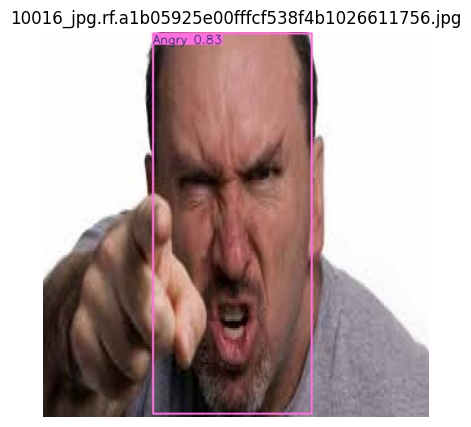

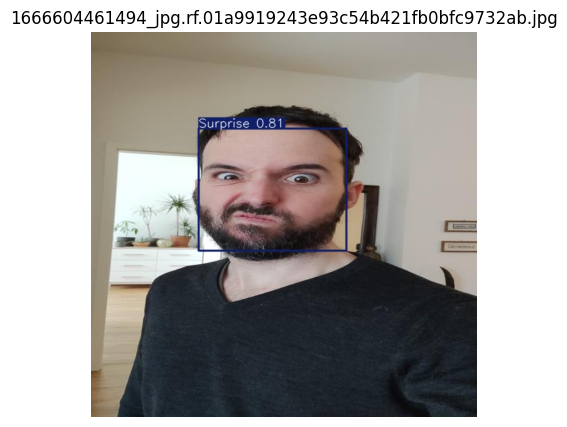

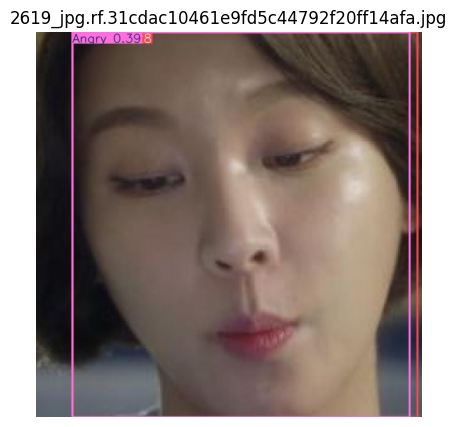

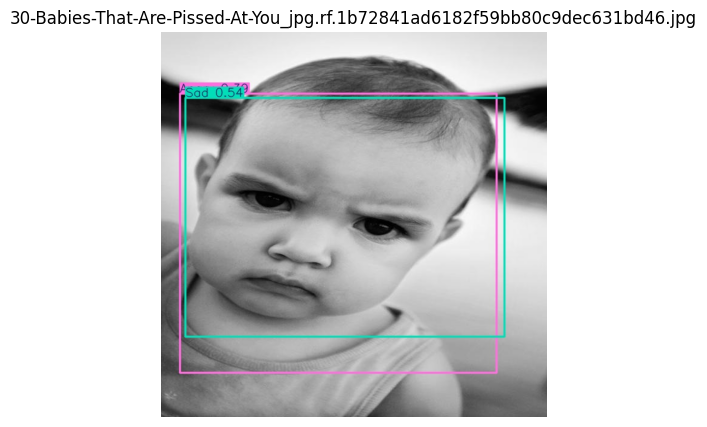

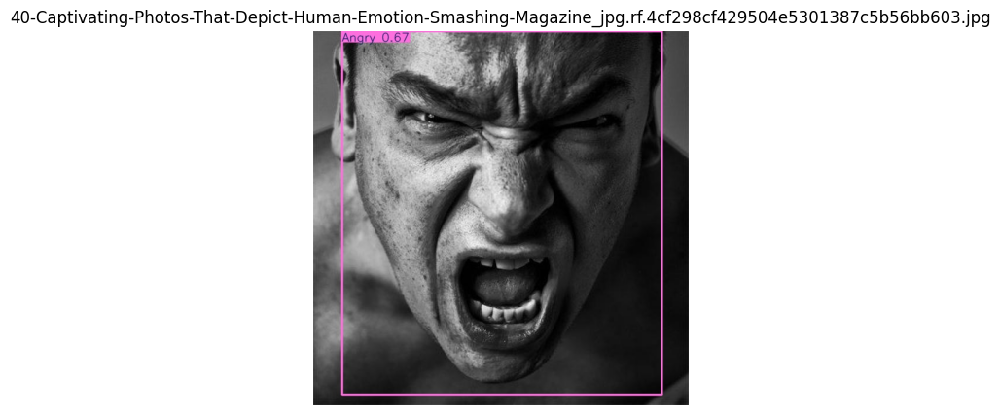

...

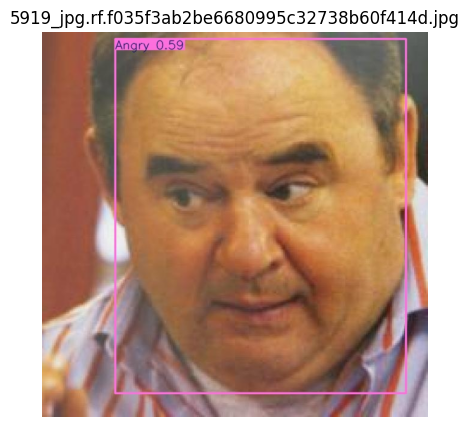

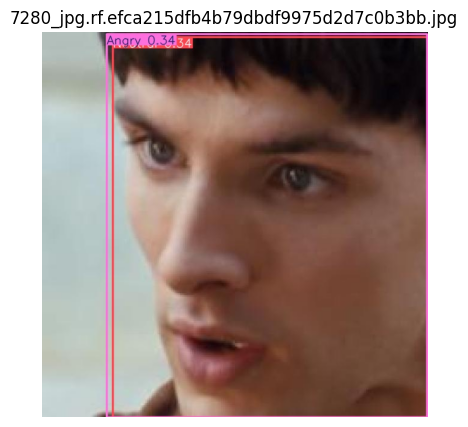

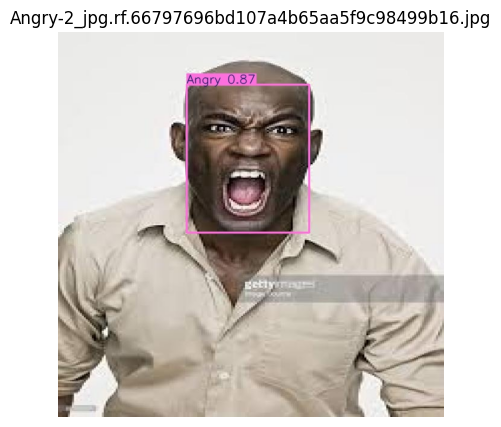

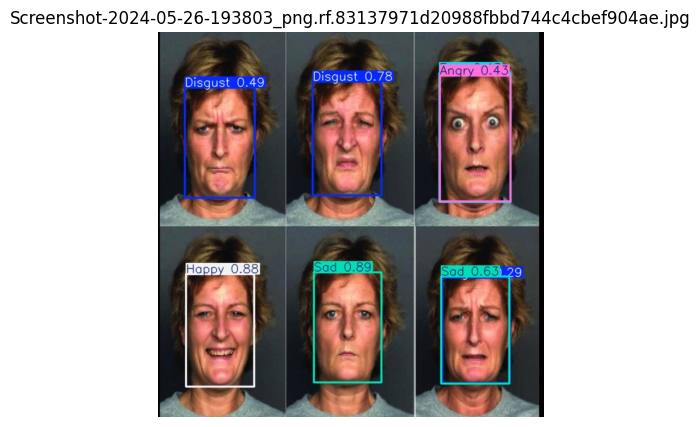

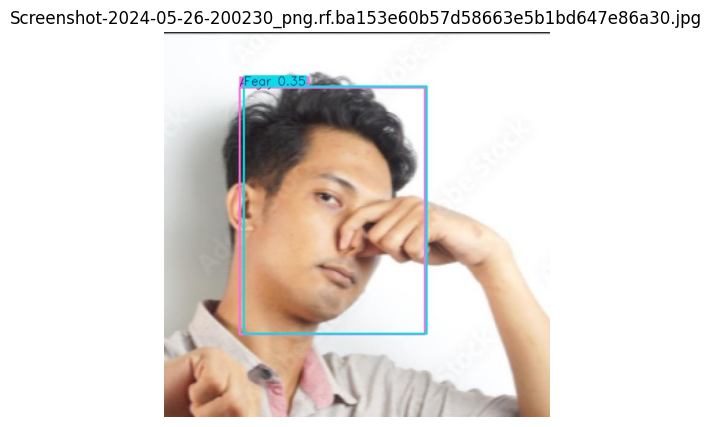

In [62]:
import matplotlib.pyplot as plt

angry_files = list((ERROR_DIR / "angry_cases").glob("*"))[:12]

for image_file in angry_files:
    image = cv2.imread(str(image_file))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(7, 5))
    plt.imshow(image)
    plt.title(image_file.name)
    plt.axis("off")
    plt.show()

Error Analysis – Angry Class

Inspection of the misclassified Angry samples revealed two major issues:

Open-mouth angry expressions (shouting/yelling) were frequently misclassified. These facial expressions differ significantly from the more common closed-mouth angry faces in the training data, making them visually closer to expressions such as Surprise.
Some images labeled as Angry appeared visually closer to Surprise than to genuine anger. In these cases, the facial expression was dominated by widened eyes and an open mouth without other strong anger-related facial cues. This suggests that part of the performance limitation is caused by label ambiguity rather than only model capability.

Consequently, improving the dataset by reviewing ambiguous labels and increasing the diversity of angry facial expressions (especially shouting or yelling faces) is expected to improve recognition performance.